In [10]:
import matplotlib.pyplot as plt
import numpy as np
print(np.__version__)
import torch 
import torch.nn as nn

import pandas as pd
# Retina mode
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

1.26.4


Text(0, 0.5, 'Y')

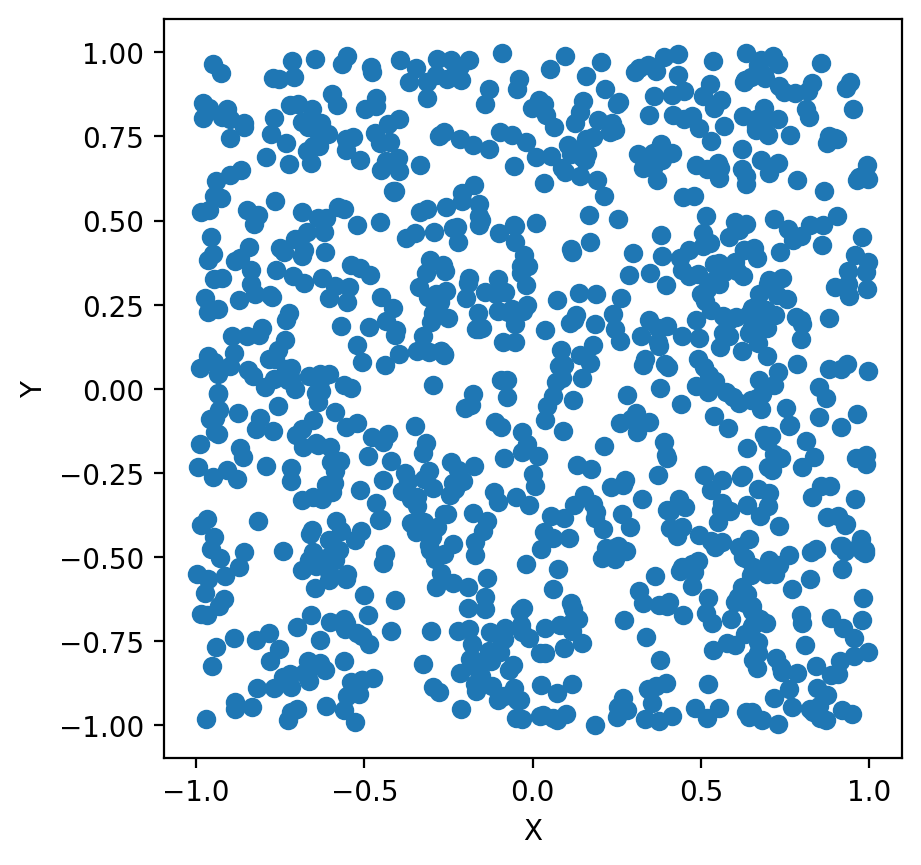

In [2]:
X = torch.distributions.Uniform(-1, 1)
Y = torch.distributions.Uniform(-1, 1)

x_samples = X.sample((1000,))
y_samples = Y.sample((1000,))

plt.scatter(x_samples, y_samples)
# aspect ratio
plt.gca().set_aspect('equal')
plt.xlabel('X')
plt.ylabel('Y')

In [3]:
## E[XY] between U(-1, 1) and U(-1, 1)

E_XY = torch.mean(x_samples * y_samples)
print(E_XY)

tensor(-0.0064)


Analytical solution for the expected value of the product of two random variables: $X\sim U(0,1)$ and $Y\sim U(0,1)$.

We know that $f_{X, Y}(x, y) = 1$ for $0 \leq x \leq 1$ and $0 \leq y \leq 1$. The expected value of the product of two random variables is given by:

\begin{equation}
\begin{aligned}
E[XY] &= \int_{0}^{1} \int_{0}^{1} xy \, dx \, dy \\
&= \int_{0}^{1} \left[ \frac{1}{2}x^2y \right]_{0}^{1} \, dy \\
&= \int_{0}^{1} \frac{1}{2}y \, dy \\
&= \left[ \frac{1}{4}y^2 \right]_{0}^{1} \\
&= \frac{1}{4}
\end{aligned}
\end{equation}


In [11]:
def E_XY(X, Y, n=1000):
    x_samples = X.sample((n,))
    y_samples = Y.sample((n,))
    return torch.mean(x_samples * y_samples)

In [17]:
X = torch.distributions.Uniform(0, 1)
Y = torch.distributions.Uniform(0, 1)

print(E_XY(X, Y, 1000000))

# This is the same as E[XY] = E[X]E[Y] for independent random variables

tensor(0.2502)


Finding $\cos(\theta)$ for $X\sim U(0,1)$ and $Y\sim U(0,1)$:

$E[X^2] = \int_{0}^{1} x^2 \, dx = \left[ \frac{1}{3}x^3 \right]_{0}^{1} = \frac{1}{3}$

$\cos(\theta) = \frac{E[XY]}{\sqrt{E[X^2]E[Y^2]}} = \frac{\frac{1}{4}}{\sqrt{\frac{1}{3}\frac{1}{3}}} = \frac{3}{4}$


For any general $X\sim U(a,b)$ and $Y\sim U(a,b)$, the expected value of the product of two random variables is given by:

\begin{equation}
\begin{aligned}
E[XY] &= \int_{a}^{b} \int_{a}^{b} xy \, dx \, dy \\
&= \int_{a}^{b} \left[ \frac{1}{2}x^2y \right]_{a}^{b} \, dy \\
&= \int_{a}^{b} \frac{1}{2}(b^2 - a^2)y \, dy \\
&= \frac{1}{2}(b^2 - a^2) \int_{a}^{b} y \, dy \\
&= \frac{1}{2}(b^2 - a^2) \left[ \frac{1}{2}y^2 \right]_{a}^{b} \\
&= \frac{1}{2}(b^2 - a^2) \left( \frac{1}{2}b^2 - \frac{1}{2}a^2 \right) \\
&= \frac{1}{4}(b^2 - a^2)(b^2 - a^2) \\
&= \frac{1}{4}(b - a)^2(b + a)^2
\end{aligned}
\end{equation}

$E[X^2] = \int_{a}^{b} x^2 \, dx = \left[ \frac{1}{3}x^3 \right]_{a}^{b} = \frac{1}{3}(b^3 - a^3)$

$\sqrt{E[X^2]E[Y^2]} = \sqrt{\frac{1}{3}(b^3 - a^3)\frac{1}{3}(b^3 - a^3)} = \frac{1}{3}(b^3 - a^3)$

And $\cos(\theta)$ for $X\sim U(a,b)$ and $Y\sim U(a,b)$ is given by:

\begin{equation}
\begin{aligned}
\cos(\theta) &= \frac{E[XY]}{\sqrt{E[X^2]E[Y^2]}} \\
&= \frac{\frac{1}{4}(b - a)^2(b + a)^2}{\frac{1}{3}(b^3 - a^3)} \\

\end{aligned}
\end{equation}




In [6]:
### cos(theta)

def E_cos_theta(X, Y, n=1000):
    x_samples = X.sample((n,))
    y_samples = Y.sample((n,))
    EXY = torch.mean(x_samples * y_samples)
    EX2 = torch.mean(x_samples ** 2)
    EY2 = torch.mean(y_samples ** 2)
    print(EXY, EX2, EY2)

    return EXY / torch.sqrt(EX2 * EY2)

In [7]:
X = torch.distributions.Uniform(0, 1)
Y = torch.distributions.Uniform(0, 1)

print(E_cos_theta(X, Y, 10000))


tensor(0.2479) tensor(0.3288) tensor(0.3344)
tensor(0.7475)


In [8]:
# Now increasing the range of the random variables
X = torch.distributions.Uniform(10, 11)
Y = torch.distributions.Uniform(10, 11)

print(E_XY(X, Y))

EX2 = torch.mean(x_samples ** 2)
EY2 = torch.mean(y_samples ** 2)

print(EX2, EY2)

tensor(110.4675)
tensor(0.3374) tensor(0.3341)


In [9]:
X = torch.distributions.Uniform(10, 11)
Y = torch.distributions.Uniform(10, 11)

print(E_cos_theta(X, Y, 10000))


tensor(110.3001) tensor(110.3019) tensor(110.4660)
tensor(0.9992)


tensor(0.0701)


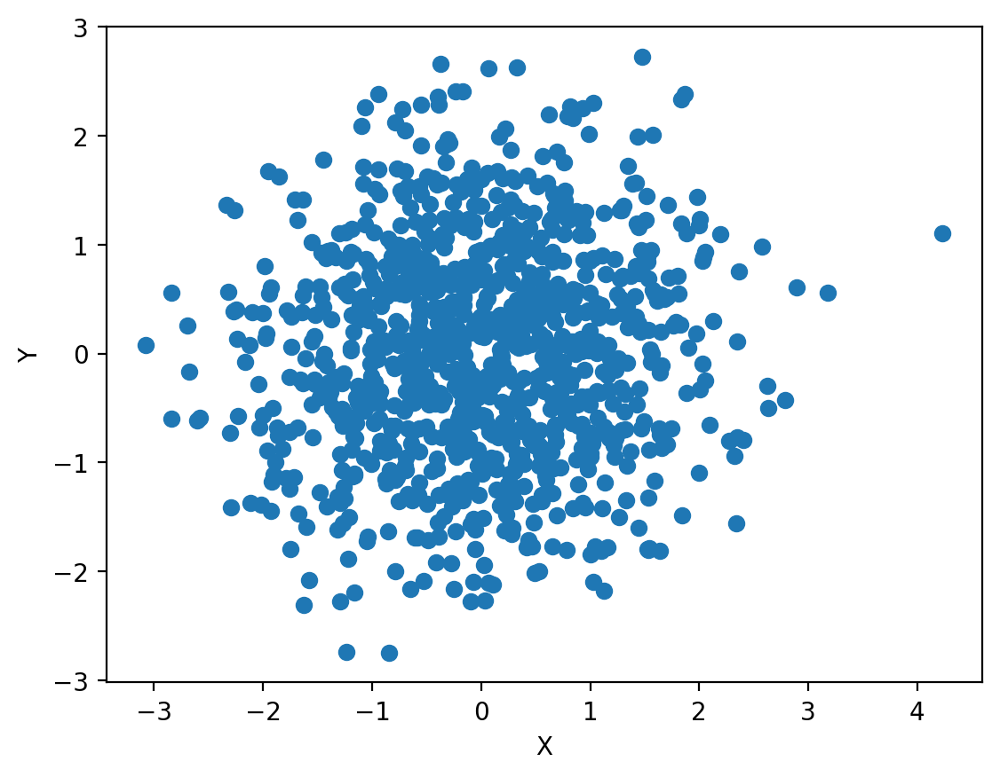

In [7]:
## E[XY] between N(0, 1) and N(0, 1)

X = torch.distributions.Normal(0, 1)
Y = torch.distributions.Normal(0, 1)

x_samples = X.sample((1000,))
y_samples = Y.sample((1000,))

plt.scatter(x_samples, y_samples)
# aspect ratio
plt.gca().set_aspect('equal')
plt.xlabel('X')
plt.ylabel('Y')

E_XY = torch.mean(x_samples * y_samples)
print(E_XY)

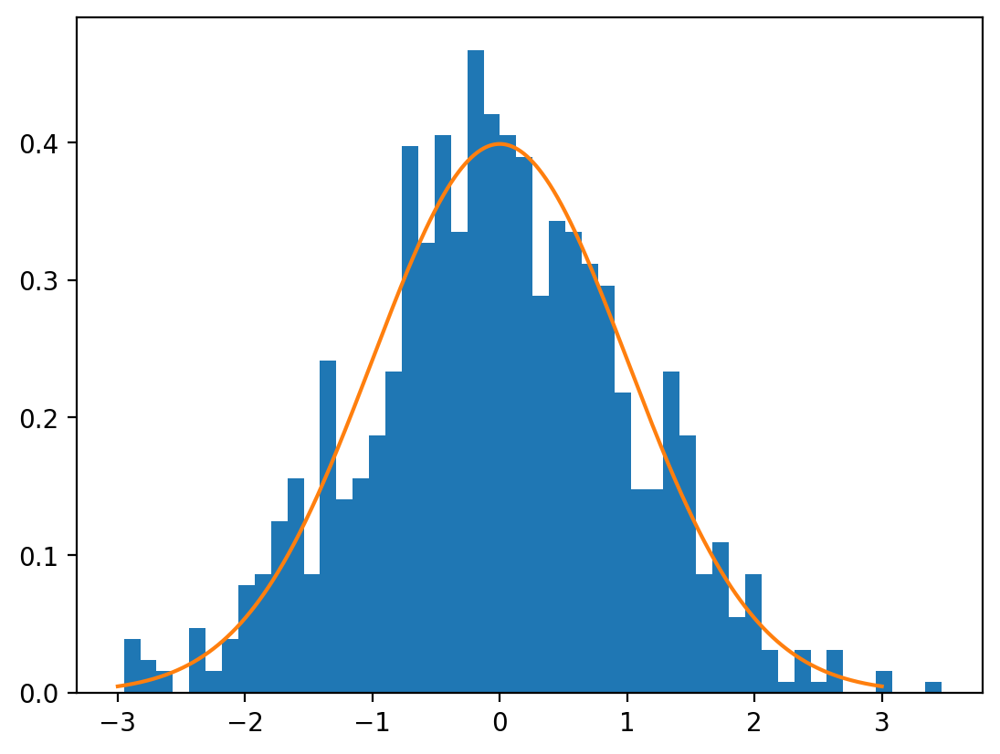

In [2]:
dist = torch.distributions.Normal(0, 1)
x = dist.sample((1000,))
plt.hist(x.numpy(), bins=50, density=True)

x_range = torch.linspace(-3, 3, 1000)
y = dist.log_prob(x_range).exp()
plt.plot(x_range.numpy(), y.numpy())

In [3]:
dist.sample([10])

tensor([-1.9083,  0.3758,  0.0051,  0.5140,  0.9852, -0.5989,  0.5222, -0.7744,
         0.9462, -1.7868])

In [7]:
dist_2d_normal = torch.distributions.MultivariateNormal(torch.tensor([0.0, 0.0]), torch.eye(2))
#dist_2d_normal = torch.distributions.MultivariateNormal(torch.tensor([0.0, 0.0]), torch.tensor([[1.0, 0.5], [0.5, 1.0]]))

dist_2d_normal.sample([10])

tensor([[ 0.0438, -0.0310],
        [ 0.0487, -0.3790],
        [-0.7872,  0.9880],
        [ 1.0010, -0.9025],
        [ 0.5449,  0.1047],
        [ 1.6466,  0.0925],
        [ 0.9357,  0.2228],
        [-1.2721,  2.5194],
        [-0.3306, -0.1152],
        [ 1.2249, -1.7330]])

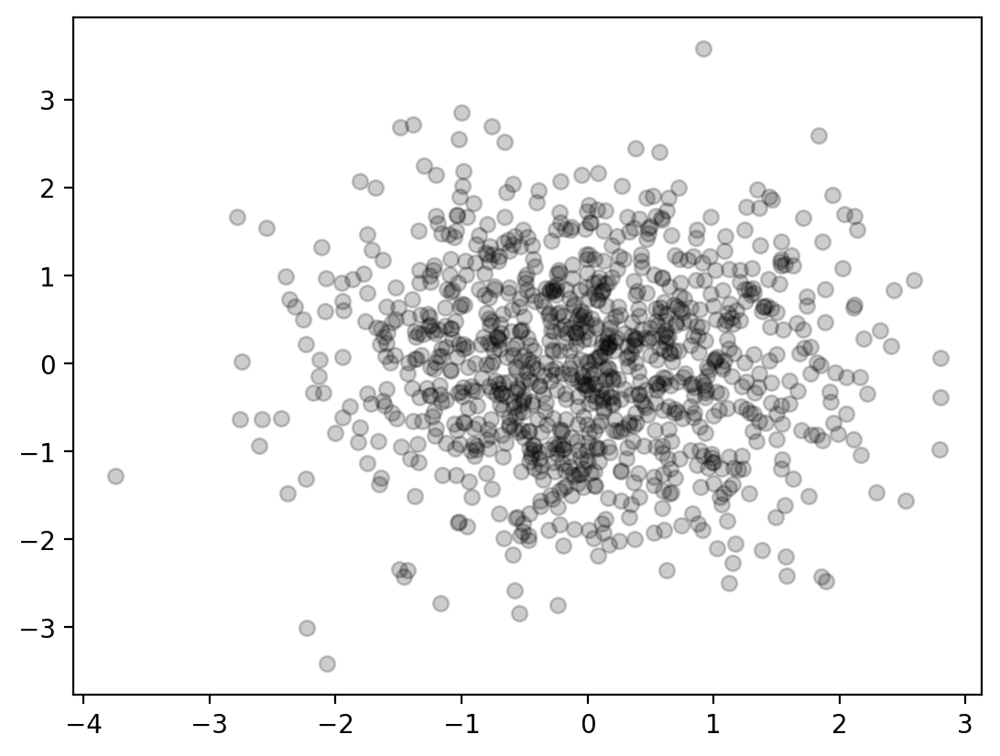

In [8]:
plt.scatter(*dist_2d_normal.sample([1000]).numpy().T, alpha=0.2, color='k')

/Users/nipun/base/lib/python3.12/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3638.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


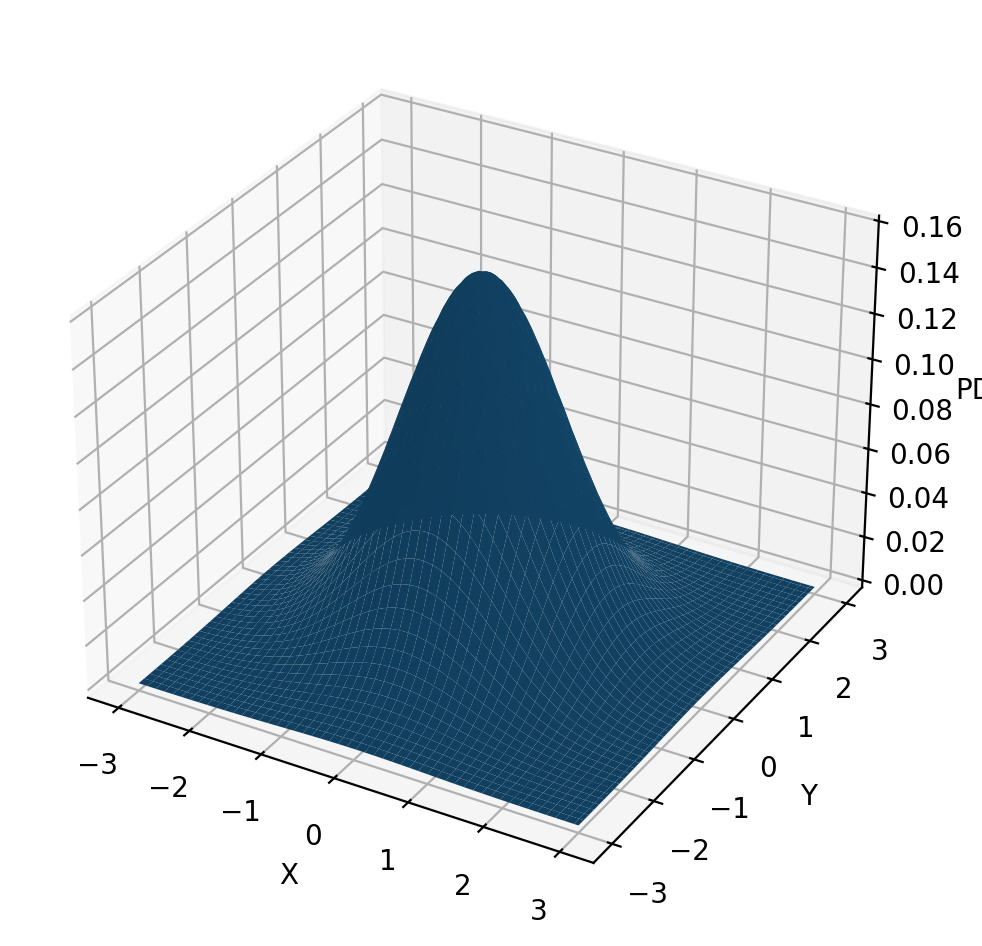

In [9]:
# Plot 2D normal distribution surface plot of PDF
from mpl_toolkits.mplot3d import Axes3D

x = torch.linspace(-3, 3, 100)
y = torch.linspace(-3, 3, 100)

X, Y = torch.meshgrid(x, y)
xy = torch.stack([X, Y], 2)
z = dist_2d_normal.log_prob(xy).exp()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X.numpy(), Y.numpy(), z.numpy())

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('PDF')

fig.tight_layout()

In [10]:
df = pd.read_html("http://socr.ucla.edu/docs/resources/SOCR_Data/SOCR_Data_Dinov_020108_HeightsWeights.html")

In [11]:
store_df = df[0]
store_df.columns = store_df.iloc[0]
store_df = store_df.iloc[1:]
store_df = store_df.astype(float)
store_df = store_df.drop(columns=["Index"])
store_df = store_df.dropna()

In [12]:
store_df.head()

,Height(Inches),Weight(Pounds)
1,65.78331,112.9925
2,71.51521,136.4873
3,69.39874,153.0269
4,68.21660,142.3354
5,67.78781,144.2971


In [13]:
### Fiting a bi-variate normal distribution to the data
data = torch.tensor(store_df.values)
mean = data.mean(0)
cov = torch.cov(data.T)
dist = torch.distributions.MultivariateNormal(mean, cov)

In [15]:
dist.loc

tensor([ 67.9931, 127.0794], dtype=torch.float64)

In [16]:
dist.covariance_matrix

tensor([[  3.6164,  11.1510],
        [ 11.1510, 135.9765]], dtype=torch.float64)

Text(0, 0.5, 'Weight')

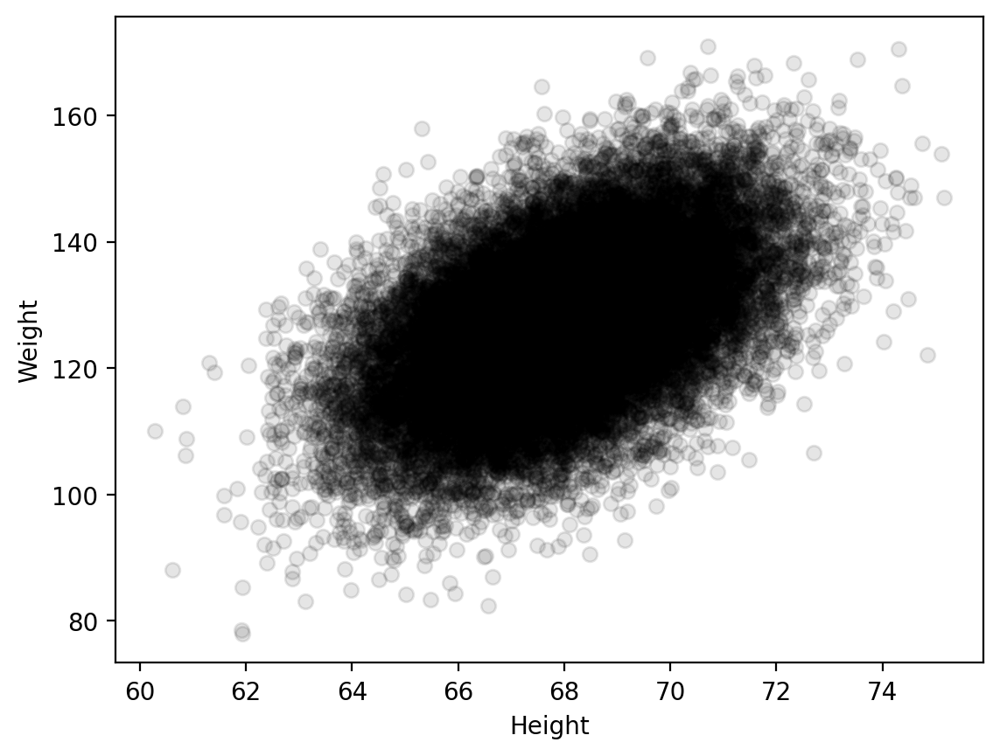

In [17]:
# Plot the data

plt.scatter(data[:, 0], data[:, 1], alpha=0.1, color='k', facecolors='k')
plt.xlabel("Height")
plt.ylabel("Weight")



In [18]:
# plot the PDF
x = torch.linspace(50, 80, 100)
y = torch.linspace(80, 280, 100)
X, Y = torch.meshgrid(x, y)
xy = torch.stack([X, Y], 2)
z = dist.log_prob(xy).exp()

import plotly.graph_objects as go

# Create surface plot with custom hover labels
fig = go.Figure(data=[go.Surface(
    x=X, y=Y, z=z, colorscale="viridis",
    hovertemplate="Height: %{x:0.2f}<br>Weight: %{y:0.2f}<br>PDF: %{z:0.5f}<extra></extra>"
)])

# Maximize figure size and reduce whitespace
fig.update_layout(
    autosize=True,
    width=1200,  # Set wider figure
    height=700,  # Set taller figure
    margin=dict(l=0, r=0, t=40, b=0),  # Remove extra whitespace
    title="2D Gaussian PDF",
    scene=dict(
        xaxis_title="Height",
        yaxis_title="Weight",
        zaxis_title="PDF"
    )
)

# Show plot
fig.show()

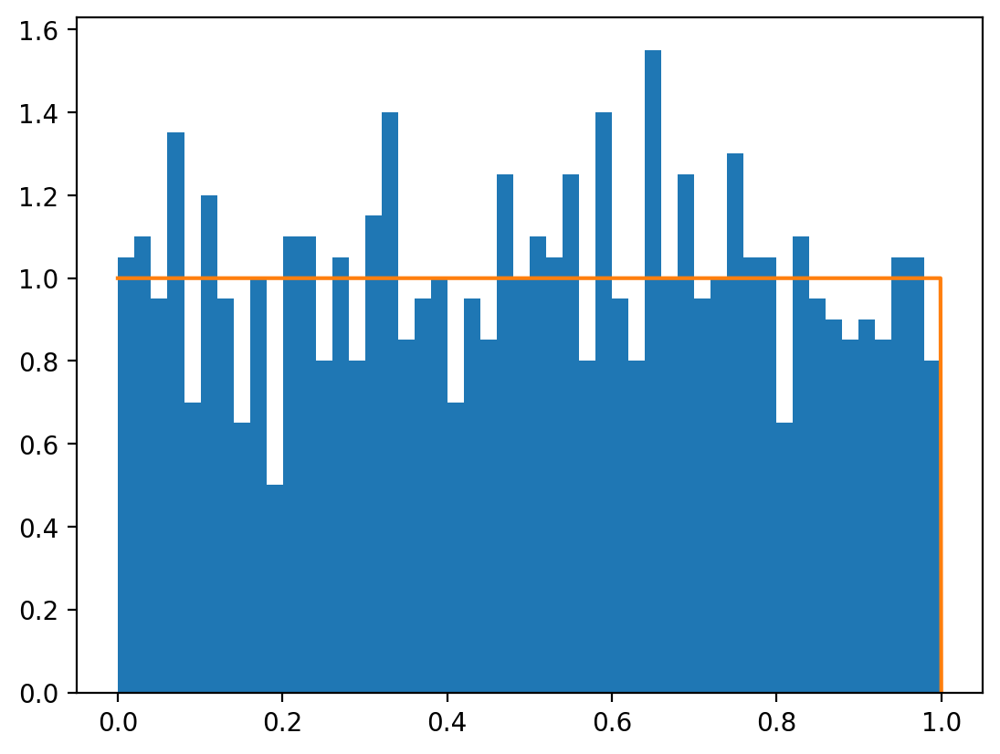

In [8]:
# uniform distribution
dist_uniform = torch.distributions.Uniform(0, 1)
x = dist_uniform.sample((1000,))
plt.hist(x.numpy(), bins=50, density=True)

x_range = torch.linspace(0, 1, 1000)
y = dist_uniform.log_prob(x_range).exp()
plt.plot(x_range.numpy(), y.numpy())


In [19]:
dist_uniform_2d = torch.distributions.Uniform(torch.tensor([0.0, 0.0]), torch.tensor([1.0, 1.0]))
dist_uniform_2d.sample([10])

tensor([[0.5493, 0.3478],
        [0.7661, 0.2568],
        [0.7199, 0.2975],
        [0.9114, 0.2916],
        [0.0045, 0.4948],
        [0.0156, 0.7434],
        [0.6856, 0.1037],
        [0.4446, 0.1913],
        [0.1995, 0.5009],
        [0.0716, 0.6085]])

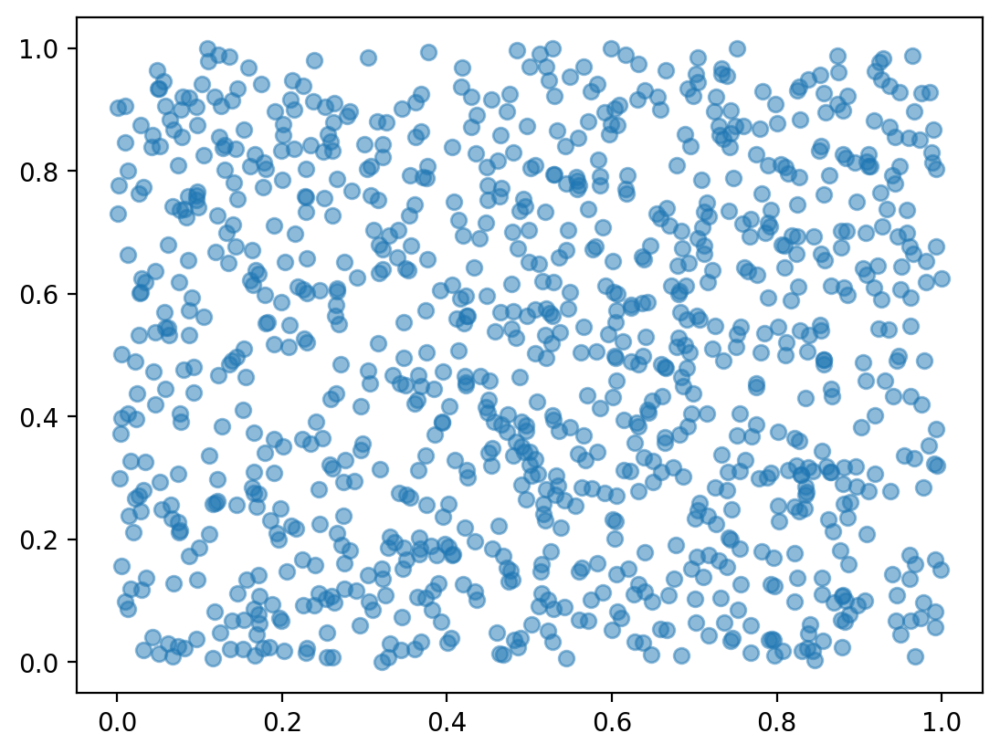

In [20]:
plt.scatter(*dist_uniform_2d.sample([1000]).numpy().T, alpha=0.5)

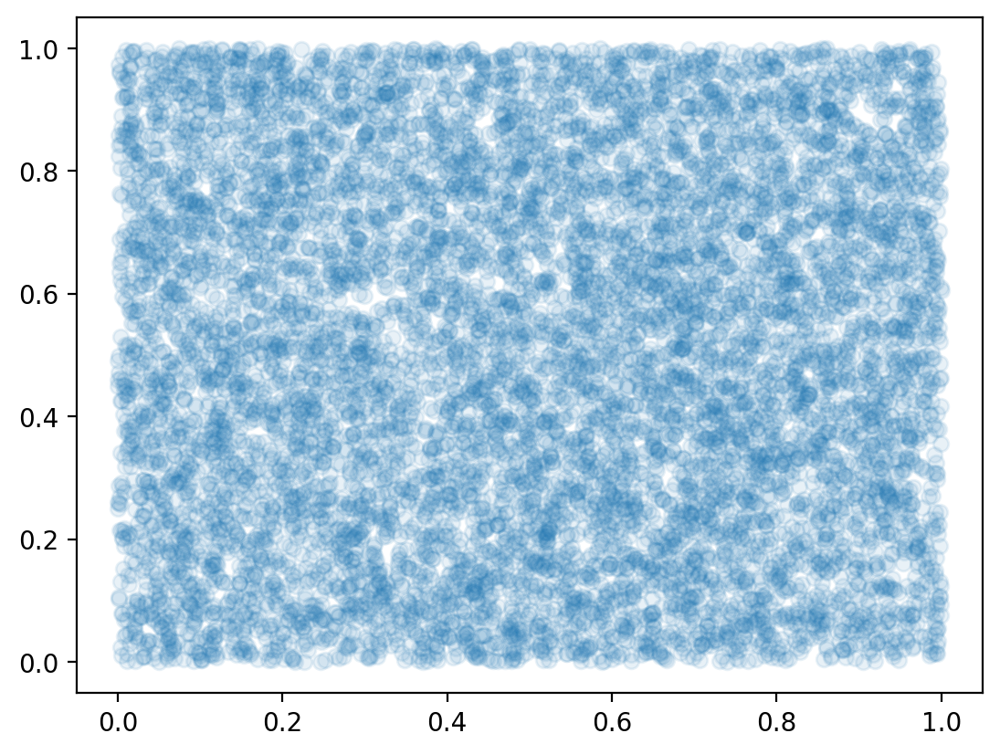

In [21]:
plt.scatter(*dist_uniform_2d.sample([10000]).numpy().T, alpha=0.1)

In [57]:
# surface plot of PDF

x = torch.linspace(0.0, 1.0, 100)
y = torch.linspace(0.0, 1.0, 100)

X, Y = torch.meshgrid(x, y)
xy = torch.stack([X, Y], 2)

Text(0.5, 0, 'PDF')

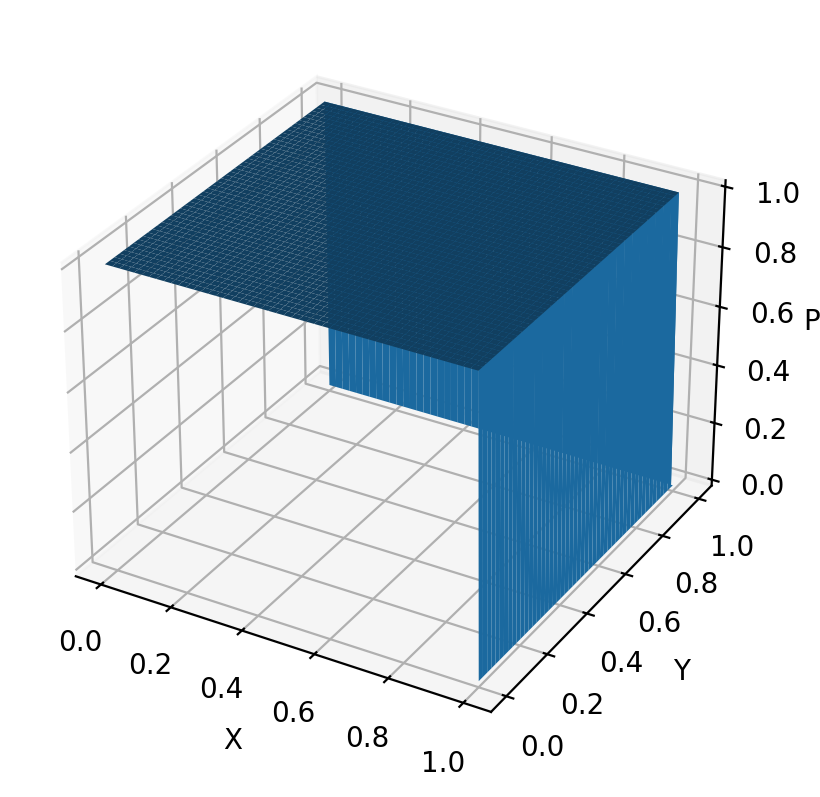

In [59]:

## Important:
## f(x, y) = f(x) * f(y) for independent random variables
## log(f(x, y)) = log(f(x)) + log(f(y))
z1 = dist_uniform_2d.log_prob(xy).sum(-1).exp()
z2 = dist_uniform.log_prob(X).exp() * dist_uniform.log_prob(Y).exp()
assert torch.allclose(z1, z2) 


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X.numpy(), Y.numpy(), z1.numpy())
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('PDF')